In [1]:
# Run this code:

%matplotlib inline

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

## Challenge 1 - Reading and Standardizing the Data


In this challenge we will work with image data and reduce the dimensions of the data to create a 2 dimensional plot. While we have not worked much with image data before, it can be represented as a numpy array where each pixel is assigned a numeric value. In this lesson, we will look at a dataset of cats and a dataset of dogs and see whether reducing them to two dimensions allows us to see if the data is separable. We will start by loading and processing the data. Run the cell below to load the two csv files and convert them into numpy arrays.



In [2]:
# Run this code

cats = np.array(pd.read_csv("https://raw.githubusercontent.com/bioramble/pca/master/cat.csv", header=None))
dogs = np.array(pd.read_csv("https://raw.githubusercontent.com/bioramble/pca/master/dog.csv", header=None))

Next, we'll examine the shape of both the cats and the dogs arrays. Print out both shapes below.



In [3]:
print(cats.shape)
print(dogs.shape)

(4096, 80)
(4096, 80)


What this means is that both arrays contain 80 images each (the number of columns). Each image is comprised of 64x64 pixels (so a total of 4096 pixels per image). The images have been flattened such that all 4096 are in a single row.

Print out column 0 of the cats array to see what the pixels values look like.

In [4]:
cats[0]

array([ 64,  23, 250, 137,  55, 173,  18, 134,  19,  47, 109, 164,  41,
        78, 108, 108, 247, 105, 158,  54, 103,   4,  23, 102, 239,  72,
        42,  21, 168, 109, 112, 177,  22, 233,  15, 236, 250, 137,  32,
         5, 178, 109,  24, 107,  53, 241, 226, 143,   5, 136,  98, 100,
        89,  66, 228,  92, 255,  88, 230,  56, 160,  69,   6,  24, 195,
       183, 239,  35, 154, 154, 122,  18,  87, 106, 174,  69,  28,  60,
       223, 101])

Using matplotlib we can plot a single cat or a single dog. We do this by reshaping the vector back to a 64x64 image and then using the imshow function.

Run the code below to look at the first dog and the first cat.

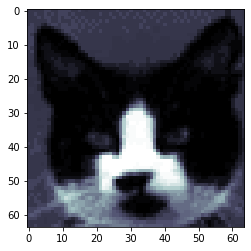

In [6]:
# Run this code:

fig, ax = plt.subplots()
ax.imshow(cats[:,0].reshape(64, 64).T, cmap=plt.cm.bone, interpolation='nearest') ;

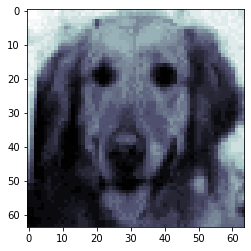

In [7]:
# Run this code:

fig, ax = plt.subplots()
ax.imshow(dogs[:,0].reshape(64, 64).T, cmap=plt.cm.bone, interpolation='nearest');

Next, we would like to create a standardization function. This function will find the mean and standard deviation of each image. We subtract the mean from each pixel and divide each pixel by the standard deviation. Write the function below.

Hint: To find the mean and standard deviation of each image, use numpy's version of mean and standard deviation and use axis=0.

In [8]:
def standardize(x):
    columns=x.shape[1]
    final = [] 
    for i in range(columns):
        mean = np.mean(x[:,i], axis=0)
        std= np.std(x[:,i], axis=0)
        a = [((z-mean)/std) for z in x[:,i]]
        final.append(a)
    final = list(map(list, zip(*final)))
    return final

In [9]:
stand_cats = standardize(cats)
stand_cats

[[0.08483333393308803,
  -1.5062915144629843,
  1.8009927202617724,
  1.4336320187015192,
  -0.2426152804814374,
  0.7772446892416945,
  -1.1407569584003332,
  0.6950719900296909,
  -1.5871319918428528,
  -1.1976252774060885,
  -0.45578272271061254,
  -0.1288298870004573,
  -1.4889072463775428,
  -0.13093046072182823,
  -0.2821890707218633,
  -0.21292752142479354,
  2.4529966268717507,
  0.378488300858303,
  1.3537021439491002,
  -1.9360229184836732,
  0.8642120758386412,
  -1.6854705973848838,
  -2.1922942402401033,
  -1.2689137764801628,
  2.36964728433105,
  -0.9072091998343506,
  -0.9016032939013258,
  -2.365675418420963,
  0.8419284092267306,
  -0.019451021781318932,
  0.5018766782053533,
  1.3819706547187485,
  -1.1522214843777998,
  1.9426517935994903,
  -2.144213177695279,
  1.2019546448179348,
  2.258455999887372,
  -0.11836704653325619,
  -1.8070370924588544,
  -0.7810736975955036,
  0.8691264737478505,
  0.4871582255721421,
  -1.9346332864319804,
  -1.4857485707939853,
  -1.

In [10]:
stand_dogs = standardize(dogs)
stand_dogs

[[2.376629071538263,
  -0.307530037273542,
  0.932548572132232,
  -0.30515588310197933,
  0.5877981585394756,
  -1.241067202215337,
  0.4017400017475847,
  -1.0382952992842271,
  -0.2409358379695109,
  1.1895159515850262,
  -1.390027031567754,
  1.2035240962456264,
  -0.9178085126997286,
  -0.6523385732204691,
  0.21409948329330278,
  -0.5574273102973929,
  -0.11894994917690989,
  0.5776088540347025,
  0.25066588009836155,
  -1.2657644923771103,
  -1.2887662293173745,
  -1.6063521386830706,
  1.578109729746593,
  -2.0843600016109565,
  -0.7827375490656235,
  -1.9216097812419102,
  -0.9525074960979446,
  1.527248283795457,
  -1.2088677722340462,
  0.6541764458700203,
  -1.5426911188243653,
  -0.24812732492671613,
  -0.5296492576762672,
  -2.0220011481455464,
  -1.5446497628758462,
  -1.1350170606867467,
  -2.206831568861496,
  -1.3317838914942097,
  -1.9848970425397041,
  0.2799035897254162,
  -1.8513455265329812,
  1.8270493921927529,
  -1.8595681061507752,
  -0.05720659414097866,
  -0

Now, use the np.concatenate function to combine the cats and dogs arrays. Use axis=1 to combine the two correctly. Make sure to put dogs first.



In [12]:
combined = np.concatenate((stand_dogs, stand_cats), axis=1)
combined

array([[ 2.37662907, -0.30753004,  0.93254857, ..., -1.80817356,
         1.42293481, -0.20363951],
       [ 2.37662907, -0.40500299,  1.15681724, ..., -2.06459792,
         1.44036713, -0.05437635],
       [ 2.37662907, -0.68349716,  0.93254857, ..., -1.73124626,
         1.45779946, -0.07925354],
       ...,
       [ 0.22755315, -0.68349716,  0.63352369, ..., -0.65426398,
         0.67334483,  0.11976401],
       [ 0.22755315, -0.40500299,  0.35941754, ..., -0.32091232,
         0.70820948, -0.45241144],
       [ 0.22755315, -0.40500299,  0.35941754, ..., -0.67990641,
         0.62104786,  0.09488681]])

Standardize the concatenated array below.



In [13]:
combined_d_c = standardize(combined)
combined_d_c

[[2.376629071538263,
  -0.307530037273542,
  0.932548572132232,
  -0.3051558831019794,
  0.5877981585394757,
  -1.2410672022153373,
  0.40174000174758473,
  -1.0382952992842274,
  -0.24093583796951085,
  1.1895159515850262,
  -1.390027031567754,
  1.2035240962456264,
  -0.9178085126997287,
  -0.6523385732204691,
  0.21409948329330278,
  -0.5574273102973929,
  -0.11894994917690992,
  0.5776088540347025,
  0.25066588009836155,
  -1.2657644923771105,
  -1.2887662293173745,
  -1.6063521386830706,
  1.578109729746593,
  -2.084360001610957,
  -0.7827375490656235,
  -1.9216097812419102,
  -0.9525074960979447,
  1.527248283795457,
  -1.2088677722340464,
  0.6541764458700203,
  -1.5426911188243655,
  -0.2481273249267161,
  -0.5296492576762672,
  -2.0220011481455464,
  -1.5446497628758464,
  -1.135017060686747,
  -2.2068315688614963,
  -1.3317838914942097,
  -1.9848970425397041,
  0.2799035897254162,
  -1.8513455265329812,
  1.827049392192753,
  -1.8595681061507754,
  -0.05720659414097866,
  -0.

## Challenge 2 - Using PCA


Now that we have created a standardized matrix of cats and dogs, we'll find the two most important components in the data.

Load the PCA function from statsmodels (read about this function here) and apply the function to our standarized data. Create a PCA model with two components.



In [14]:
pca = PCA(n_components=2)
pca.fit(combined_d_c)
data_pca = pca.transform(combined_d_c)
data_pca

array([[10.05797014, -9.71855533],
       [10.20444589, -9.43043245],
       [10.21546541, -9.60424399],
       ...,
       [ 1.78943626, -3.15286365],
       [ 1.55785247, -3.08694619],
       [ 1.29789361, -3.1983058 ]])

In [15]:
data_pca.shape

(4096, 2)

Use numpy to find to transpose the standardized pet array. This will help us compute the projection.




In [16]:
trans_data = data_pca.transpose()
trans_data

array([[10.05797014, 10.20444589, 10.21546541, ...,  1.78943626,
         1.55785247,  1.29789361],
       [-9.71855533, -9.43043245, -9.60424399, ..., -3.15286365,
        -3.08694619, -3.1983058 ]])

In [17]:
trans_data.shape

(2, 4096)

Find the dot product of the transposed standardized pet matrix and the factors of the PCA model found above. This will be the projection onto 2 dimensions. This means that each cat and dog image will now only have two columns instead of 4096.



In [18]:
dotty = np.dot(trans_data, combined_d_c)
dotty.shape

(2, 160)

In [19]:
trans_dotty = dotty.transpose()
trans_dotty

array([[ 14348.51404095,  -3981.25943297],
       [ 10873.02274783,   5211.51019066],
       [ -4378.84811763,   4874.92263071],
       [  1717.00750209,   8914.44279875],
       [ 11101.8840364 ,  -1114.37053915],
       [ -2968.6919351 ,  12223.60195175],
       [  7483.06180643,   3579.58781066],
       [  4833.63699205,  10566.11876341],
       [  4191.47400732,  10471.8232468 ],
       [ 13334.74078012,   -597.04232746],
       [   118.38412256,   9615.53073326],
       [  7355.88387282,   4776.32937697],
       [  2874.48878381,   4525.68957218],
       [ -1033.48451826,   4864.29685978],
       [  6479.84258217,   8603.5734962 ],
       [  5938.77319603,   9088.02896192],
       [  5412.98959317,   2248.43975205],
       [ 13186.93811987,   5746.19283378],
       [  6217.39373885,   7773.484583  ],
       [  5259.3631059 ,  12111.02604923],
       [ -1224.55685037,   9684.24349927],
       [   545.6428193 ,  10373.06425667],
       [  3317.29732826,   4130.01602807],
       [  4

## Challenge 3 - Plotting the Data


Now that we have reduced our cats and dogs arrays, we can easily plot the data in a way that the human eye can understand. We can look at this plot to see whether there are differences between the cat and dog images.

In the cell below, turn the two dimensional projection into a pandas dataframe and name the columns pc1, and pc2 respectively.



In [20]:
df_pets = pd.DataFrame(trans_dotty, columns=['pc1', 'pc2'])
df_pets.head()

,pc1,pc2
0,14348.514041,-3981.259433
1,10873.022748,5211.510191
2,-4378.848118,4874.922631
3,1717.007502,8914.442799
4,11101.884036,-1114.370539


In [21]:
df_pets.shape

(160, 2)

Create a labels list. This list will be of size 160. The first 80 elements in the list will be the word blue, and the last 80 elements will be red. This will ensure that all dog observations will be colored in blue and all cats will be colored in red. Name this list colors.



In [22]:
colors = []

for i in range(160):
    if i < 80:
        colors.append('blue')
    else:
        colors.append('red')

Create a scatter plot of pc1 and pc2 below. Use the colors list above to color the observations by setting c=colors.



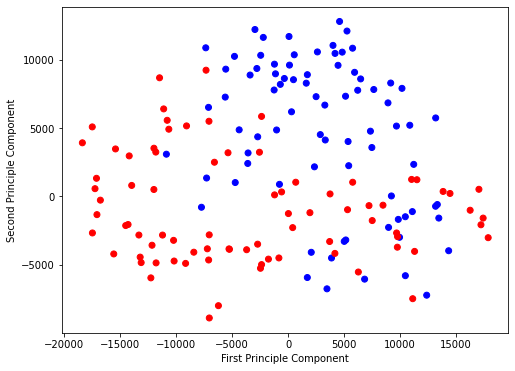

In [23]:
plt.figure(figsize=(8, 6))

plt.scatter(df_pets['pc1'], df_pets['pc2'], c=colors) 
plt.xlabel('First Principle Component')
plt.ylabel('Second Principle Component')

plt.show()

Do you see a clear separation between cats and dogs? Write your answer below.



In [25]:
## Yes, there's a good separation between the dogs and the cats, although
## at the middle of the graph they tend to mix a bit, so this could probably mean that
## we can separate the data even more by reducing dimensionality in some way.